Código desenvolvido por Tailine Corrêa (email: tailine.atm@gmail.com)

Gerando figuras para verificação dos dados

In [22]:
#Library
import os
from glob import glob
import datetime
import pandas as pd
import csv
import plotly as plt
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import missingno
import plotly.express as px

In [23]:
#lendo dados organizados em dia e hora
os.chdir(r'\DadosAir_Purple')
dt=pd.read_csv('Dado_dia_Primary_Real_Time_outside.csv').iloc[:,1:]
dt2=pd.read_csv('Dado_hora_Primary_Real_Time_outside.csv').iloc[:,1:]

In [24]:
#Arrumando a data
dt['data'] = pd.to_datetime(dt['data'], format='%Y-%m-%d')
dt2['data'] = pd.to_datetime(dt2['data'], format='%Y-%m-%d %H:%M:%S')

In [25]:
#Ultrapassagens e max
dt['fl_ult_cf1']=0
dt.fl_ult_cf1[dt.PM25_CF1>15]=1
dt['fl_ult_atm']=0
dt.fl_ult_atm[dt.PM25_ATM>15]=1
df_ult=dt.groupby(by=['estado', 'estacao', 'local', 'tipo','t_inicial', 't_final']).agg({'PM25_CF1':['mean','max'], 'PM25_ATM':['mean','max'],
                                                                                         'fl_ult_cf1':['count','sum'],'fl_ult_atm':['count','sum']})
df_ult.columns=['PM25_CF1_med','PM25_CF1_max','PM25_ATM_med','PM25_ATM_max','PM25_CF1_day','PM25_CF1_ult','PM25_ATM_day','PM25_ATM_ult']
df_ult.to_csv('Tabela_ultrapassagem_Primary_Real_Time_outside.csv')

C:\Users\Tailine\AppData\Local\Temp\ipykernel_10664\3899973188.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Tailine\AppData\Local\Temp\ipykernel_10664\3899973188.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
## nomes das estações
dt.estacao=dt.estacao.str[:-10]
dt2.estacao=dt2.estacao.str[:-10]
dt=dt[~(dt.estacao.isin(['UF - Coker Lab - Cacoal - Rondônia - Brazil','UF - Coker Lab - Porto Velho - Rondônia - Brazil']))]
dt2=dt2[~(dt2.estacao.isin(['UF - Coker Lab - Cacoal - Rondônia - Brazil','UF - Coker Lab - Porto Velho - Rondônia - Brazil']))]
dt.estacao.values

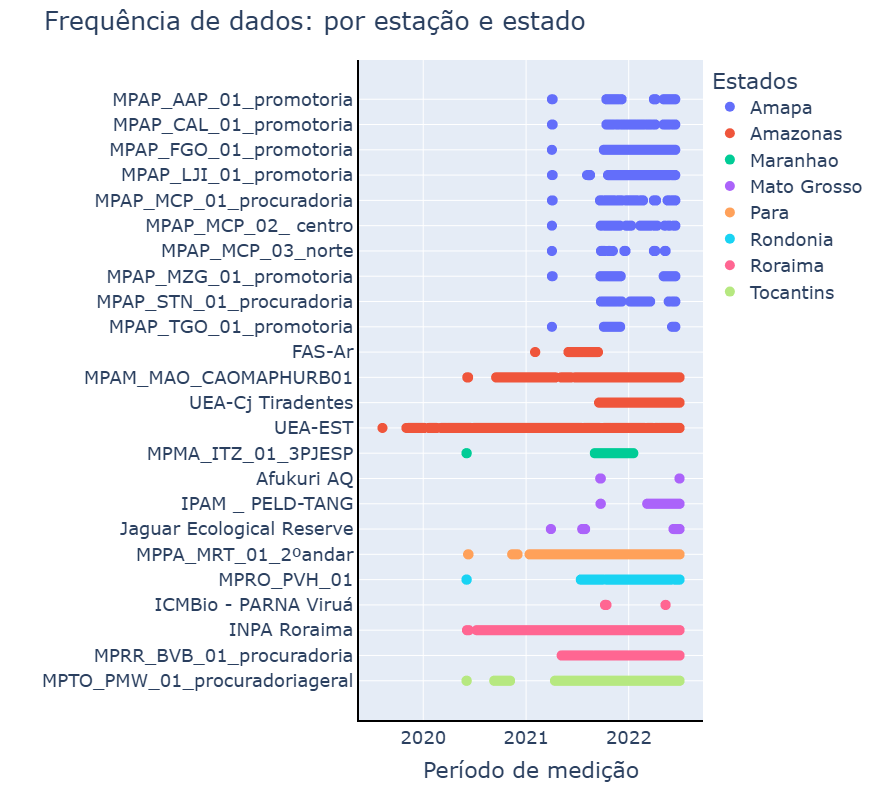

In [37]:
##Figura de frequência por estação e por estado
fig = px.scatter(dt2[~(dt2.PM25_CF1.isnull())], y=["estacao",'estado'], x="data",color='estado')
fig.update_layout(height=800,width=1000,font=dict(size= 18),title="Frequência de dados: por estação e estado",
    xaxis_title="Período de medição",
    yaxis_title=" ",yaxis = dict(autorange="reversed"),
    legend_title="Estados")
fig.update_xaxes(showline=True, linewidth=2, linecolor='black')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black')
fig.update_traces(marker_size=10)
#fig.update_yaxes(categoryorder='array', categoryarray= [])

fig.show()

In [82]:
dt.estacao.unique()

array(['MPAP_AAP_01_promotoria', 'MPAP_CAL_01_promotoria',
       'MPAP_FGO_01_promotoria', 'MPAP_LJI_01_promotoria',
       'MPAP_MAC_01_Zona_Norte', 'MPAP_MCP_01_procuradoria',
       'MPAP_MCP_02_ centro', 'MPAP_MCP_03_norte',
       'MPAP_MZG_01_promotoria', 'MPAP_STN_01_procuradoria',
       'MPAP_TGO_01_promotoria', 'FAS-Ar', 'MPAM_MAO_CAOMAPHURB01',
       'UEA-Cj Tiradentes', 'UEA-EST', 'MPMA_ITZ_01_3PJESP', 'Afukuri AQ',
       'IPAM _ PELD-TANG', 'Jaguar Ecological Reserve',
       'MPPA_MRT_01_2ºandar', 'MPRO_PVH_01', 'ICMBio - PARNA Viruá',
       'INPA Roraima', 'MPRR_BVB_01_procuradoria',
       'MPTO_PMW_01_procuradoriageral'], dtype=object)

In [88]:
##Figura de concentrações por estação e estado em relação a OMS
fig = px.line(dt, x="data", y=["PM25_CF1"], color="estacao",template='seaborn',row_facet='estado')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title=" ",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Amapá")
fig.update_xaxes(range=['2021-02-01', '2022-06-30'])
fig.update_yaxes(range=[0, 80])
fig.show()

,estado,estacao,local,tipo,t_inicial,t_final,data,PM25_CF1,PM25_ATM,max,count_null_D,null_pct_D,fl_ult_cf1,fl_ult_atm,OMS
0,Amapa,MPAP_AAP_01_promotoria,(2.04586 -50.792344),Primary Real Time,04_02_2021,06_15_2022,2021-04-02,NaN,NaN,5,4,80.000000,0,0,15
1,Amapa,MPAP_AAP_01_promotoria,(2.04586 -50.792344),Primary Real Time,04_02_2021,06_15_2022,2021-04-03,NaN,NaN,24,24,100.000000,0,0,15
2,Amapa,MPAP_AAP_01_promotoria,(2.04586 -50.792344),Primary Real Time,04_02_2021,06_15_2022,2021-04-04,NaN,NaN,24,24,100.000000,0,0,15
3,Amapa,MPAP_AAP_01_promotoria,(2.04586 -50.792344),Primary Real Time,04_02_2021,06_15_2022,2021-04-05,NaN,NaN,24,23,95.833333,0,0,15
4,Amapa,MPAP_AAP_01_promotoria,(2.04586 -50.792344),Primary Real Time,04_02_2021,06_15_2022,2021-04-06,NaN,NaN,24,24,100.000000,0,0,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14969,Tocantins,MPTO_PMW_01_procuradoriageral,(-10.176555 -48.332757),Primary Real Time,06_02_2020,06_30_2022,2022-06-26,7.908152,7.881167,24,2,8.333333,0,0,15
14970,Tocantins,MPTO_PMW_01_procuradoriageral,(-10.176555 -48.332757),Primary Real Time,06_02_2020,06_30_2022,2022-06-27,6.954984,6.953460,24,3,12.500000,0,0,15
14971,Tocantins,MPTO_PMW_01_procuradoriageral,(-10.176555 -48.332757),Primary Real Time,06_02_2020,06_30_2022,2022-06-28,3.415824,3.412902,24,7,29.166667,0,0,15
14972,Tocantins,MPTO_PMW_01_procuradoriageral,(-10.176555 -48.332757),Primary Real Time,06_02_2020,06_30_2022,2022-06-29,8.201947,8.201246,24,5,20.833333,0,0,15


In [31]:
##Figura de concentrações das estações para o estado em relação a OMS: Amapá

fig = px.line(dt[(dt.estado=='Amapa')], x="data", y=["PM25_CF1"], color="estacao",template='seaborn')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title=" ",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Amapá")
fig.update_xaxes(range=['2021-02-01', '2022-06-30'])
fig.update_yaxes(range=[0, 80])
fig.show()

In [32]:
##Figura de concentrações das estações para o estado em relação a OMS: Amazonas

fig = px.line(dt[(dt.estado=='Amazonas')], x="data", y=["PM25_CF1"], color="estacao",template='seaborn')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title="Data",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Amazonas")
fig.show()

In [33]:
##Figura de concentrações das estações para o estado em relação a OMS: Roraima

fig = px.line(dt[(dt.estado=='Roraima')], x="data", y=["PM25_CF1"], color="estacao",template='seaborn')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title="Data",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Roraima")
fig.show()

In [36]:
##Figura de concentrações das estações para o estado em relação a OMS: Pará

fig = px.line(dt[(dt.estado=='Para')], x="data", y=["PM25_CF1"], color="estacao",template='seaborn')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title="Data",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Pará")
fig.show()

In [35]:
##Figura de concentrações das estações para o estado em relação a OMS: Tocantins

fig = px.line(dt2[(dt2.estado=='Tocantins')], x="data", y=["PM25_CF1"], color="estacao",template='seaborn')
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="black", line_width=5, opacity=1, line_dash="dot",
    x0=0, x1=1, xref="paper", y0=15, y1=15, yref="y"
)

fig.add_annotation(text="OMS 2021",x='2022-05-30', y=15, font=dict(size= 30))
#fig = px.line(dt[(dt.estado=='Amapa')], x="data", y="OMS", color="estacao")
fig.update_layout(height=800,width=1000,font=dict(size= 18),
    xaxis_title="Data",
    yaxis_title="MP2,5 (microgramas/m3) ",
    legend_title="Tocantins")
fig.show()